In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import warnings
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio

warnings.filterwarnings('ignore')
import nltk
nltk.download('wordnet', download_dir='/root/nltk_data')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))
from nltk import WordNetLemmatizer, word_tokenize

import string
from wordcloud import WordCloud
from PIL import Image
import re
from tqdm import tqdm
from sklearn import preprocessing, decomposition, model_selection, metrics, pipeline
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import log_loss, roc_auc_score, classification_report
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.metrics import accuracy_score
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD
import xgboost as xgb

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional, Activation, GRU, BatchNormalization
from tensorflow.keras.layers import GlobalMaxPooling1D, Conv1D, MaxPooling1D, Flatten, Bidirectional, SpatialDropout1D, Embedding
from tensorflow.keras.preprocessing import sequence, text
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

from keras.layers import Dense, Dropout, LSTM, Activation, GRU, BatchNormalization
from keras.models import Sequential

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /usr/share/nltk_data...


In [3]:
hotels_df =pd.read_csv(r'/kaggle/input/booking-data/booking_Romania.csv')

In [4]:
hotels_df


,Hotel_Name,type,stars,Average_score,Total_reviews,Breakfast,lat,lng,Hotel_Address,Reviewer_Title,Reviewer_Score,Positive_Review,Negative_Review,Reviewer_travellerType,Reviewer_room,Reviewer_nightsStay,Review_Date,Reviewer_Nationality
0,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"7 Strada Johann Gött, 500025 Braşov, Romania",Great Place to Stay in Brasov!,10.0,The breakfast was delicious. The hotel locatio...,NaN,Group,Deluxe Double Room,2.0,5-Aug-22,Ireland
1,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"8 Strada Johann Gött, 500025 Braşov, Romania",Historic city break,9.0,Central location everything was within walking...,nothing,Couple,Deluxe Double Room,2.0,17-Mar-23,United Kingdom
2,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"9 Strada Johann Gött, 500025 Braşov, Romania",Exceptional,10.0,-,Acces to the room at little bit difficult,Family,Deluxe Double Room,1.0,9-Mar-23,Romania
3,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"10 Strada Johann Gött, 500025 Braşov, Romania",Exceptional,10.0,"Excellent, as usual. Great location, right in ...",It's really hard to find a parking spot near t...,Couple,Deluxe Double Room,2.0,18-Feb-23,Romania
4,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"11 Strada Johann Gött, 500025 Braşov, Romania",Perfect,10.0,"Everything was perfect, the staff was super fr...",NaN,Couple,Deluxe Double Room,5.0,18-Feb-23,Greece
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21618,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",Overall a nice experience,8.0,The location and style of the hotel were great...,No lights in the carpark at the back and it wa...,Couple,Economy Double Room 3*,1.0,6-Aug-22,Ireland
21619,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",ours stay was great,9.0,quite,they didn’t change the towels in 2 days,Couple,Double or Twin Room,2.0,26-Jul-22,Romania
21620,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",Good value for the money paid,8.0,The price and location is good. The breakfast ...,"The internet was working in the main building,...",Family,Economy Double Room 3*,3.0,21-Jul-22,United States of America
21621,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",A beautiful place,9.0,"The building is beautiful, the breakfast amazi...",Room was beautiful but it lacked some lightbul...,Family,Deluxe Double or Twin Room,1.0,17-Jun-22,United Kingdom


Missing values

In [5]:
hotels_df.isna().sum()

Hotel_Name                   0
type                         0
stars                     6182
Average_score               40
Total_reviews                0
Breakfast                 6502
lat                          0
lng                          0
Hotel_Address                0
Reviewer_Title              34
Reviewer_Score               4
Positive_Review           1649
Negative_Review           8487
Reviewer_travellerType       4
Reviewer_room              205
Reviewer_nightsStay          4
Review_Date                  4
Reviewer_Nationality        27
dtype: int64

In [6]:
hotels_df = hotels_df.dropna(subset=['Positive_Review'])

hotels_df = hotels_df.dropna(subset=['Negative_Review'])


In [7]:
hotels_df.Hotel_Name.nunique() 

757

In [8]:
hotels_df

,Hotel_Name,type,stars,Average_score,Total_reviews,Breakfast,lat,lng,Hotel_Address,Reviewer_Title,Reviewer_Score,Positive_Review,Negative_Review,Reviewer_travellerType,Reviewer_room,Reviewer_nightsStay,Review_Date,Reviewer_Nationality
1,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"8 Strada Johann Gött, 500025 Braşov, Romania",Historic city break,9.0,Central location everything was within walking...,nothing,Couple,Deluxe Double Room,2.0,17-Mar-23,United Kingdom
2,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"9 Strada Johann Gött, 500025 Braşov, Romania",Exceptional,10.0,-,Acces to the room at little bit difficult,Family,Deluxe Double Room,1.0,9-Mar-23,Romania
3,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"10 Strada Johann Gött, 500025 Braşov, Romania",Exceptional,10.0,"Excellent, as usual. Great location, right in ...",It's really hard to find a parking spot near t...,Couple,Deluxe Double Room,2.0,18-Feb-23,Romania
5,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"12 Strada Johann Gött, 500025 Braşov, Romania",Exceptional,10.0,"very nice rooms, very good breakfast","not 24/24 reception open, no parking",Group,Deluxe Double Room,1.0,2-Feb-23,Romania
7,HOTEL BOUTIQUE CASA CHITIC -HOTEL AND RESTAURA...,Hotel,3.0,9.5,1210,Buffet,45.641366,25.590694,"14 Strada Johann Gött, 500025 Braşov, Romania",Wonderful,9.0,"Nice boutique hotel on the old city center,ver...",No any windows in my room and need to be lucky...,Solo traveler,Deluxe Double Room,1.0,23-Jan-23,Romania
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21618,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",Overall a nice experience,8.0,The location and style of the hotel were great...,No lights in the carpark at the back and it wa...,Couple,Economy Double Room 3*,1.0,6-Aug-22,Ireland
21619,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",ours stay was great,9.0,quite,they didn’t change the towels in 2 days,Couple,Double or Twin Room,2.0,26-Jul-22,Romania
21620,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",Good value for the money paid,8.0,The price and location is good. The breakfast ...,"The internet was working in the main building,...",Family,Economy Double Room 3*,3.0,21-Jul-22,United States of America
21621,House of Dracula Hotel,Hotel,4.0,8.4,1417,Buffet,45.596703,25.561058,"Poiana lui Stechil no 22, 500001 Poiana Brasov...",A beautiful place,9.0,"The building is beautiful, the breakfast amazi...",Room was beautiful but it lacked some lightbul...,Family,Deluxe Double or Twin Room,1.0,17-Jun-22,United Kingdom


In [9]:
hotels_df['Review_Date'] = pd.to_datetime(hotels_df['Review_Date'])
start_date = pd.to_datetime('1-Jun-20')
end_date = pd.to_datetime('15-Mar-23')

filtered_df = hotels_df.loc[(hotels_df['Review_Date'] >= start_date) & (hotels_df['Review_Date'] <= end_date)]

review_counts = filtered_df.groupby('Review_Date').size().reset_index(name='Count')

fig = px.line(review_counts, x='Review_Date', y='Count', title='Evoluția numărului de review-uri în perioada Iunie 2020 - Martie 2023 ')
fig.update_xaxes(title='Data')
fig.update_yaxes(title='Număr review-uri')

fig.show()

In [9]:
average_counts = hotels_df['Average_score'].value_counts()
sorted_counts = sorted(average_counts.items(), key=lambda x: x[1], reverse=True)
x_values = [item[0] for item in sorted_counts]
y_values = [item[1] for item in sorted_counts]
colors = px.colors.qualitative.Plotly * ((len(x_values) // len(px.colors.qualitative.Plotly)) + 1)

fig = go.Figure(data=go.Bar(x=x_values, y=y_values,marker=dict(color=colors)))
fig.update_layout(
    title='Distribuția review-urilor în funcție de Average Score',
    xaxis_title='Rating',
    yaxis_title='Count',
    title_font=dict(size=20),
    showlegend=False,
    bargap=0
)

pio.show(fig)

In [10]:
room_type_count = hotels_df['Reviewer_room'].value_counts()

top_room_types = room_type_count.head(10).sort_values(ascending=True)

colors = px.colors.qualitative.Plotly

# Create the bar chart
fig = go.Figure(data=[go.Bar(
    y=top_room_types.index,
    x=top_room_types.values,
    orientation='h',
    marker=dict(color=colors)
)])

# Set layout options for the chart
fig.update_layout(
    title='Cele mai frecventate tipuri de camere de hotel',
    xaxis_title='Count',
    yaxis_title='Room Type',
    height=500,
    width=800,
    template='plotly_white'
)

# Display the chart
fig.show()


In [74]:
score_counts = hotels_df['Reviewer_Score'].value_counts()

sorted_counts = sorted(score_counts.items(), key=lambda x: x[1], reverse=True)
x_values = [item[0] for item in sorted_counts]
y_values = [item[1] for item in sorted_counts]
colors = px.colors.qualitative.Plotly * ((len(x_values) // len(px.colors.qualitative.Plotly)) + 1)

fig = go.Figure(data=go.Bar(y=x_values, x=y_values,orientation='h',marker=dict(color=colors)))
fig.update_layout(
    title='Distribuția review-urilor date de turiști',
    xaxis_title='Rating',
    yaxis_title='Count',
    title_font=dict(size=20),
    showlegend=False,
    bargap=0
)
pio.show(fig)

In [75]:
ReviewerScore_stats = hotels_df['Reviewer_Score'].describe()

ReviewerScore_stats

count    12385.000000
mean         8.746443
std          1.457969
min          1.000000
25%          8.000000
50%          9.000000
75%         10.000000
max         10.000000
Name: Reviewer_Score, dtype: float64

In [76]:
top_countries = hotels_df.groupby('Reviewer_Nationality')['Reviewer_Nationality'].count().sort_values(ascending=False).head(10)
values = top_countries.values
names = top_countries.index
fig = px.pie(
    values=values,
    names=names,
    title='Top 10 naționalități ale turiștilor în România ',
    labels={'values': 'Count', 'names': 'Country'},
    template='plotly_white'
)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(width=800, height=600)
fig.show()

In [77]:
hotels = hotels_df[hotels_df['type'] == 'Hotel']

Hotel_Name_count = hotels['Hotel_Name'].value_counts()

top_hotels = Hotel_Name_count[:10]
colors = px.colors.qualitative.Plotly

fig = go.Figure(data=[go.Bar(
    y=top_hotels.index,
    x=top_hotels.values,
    orientation='h',
    marker=dict(color=colors)
)])

fig.update_layout(
    title='Top 10 unități hoteliere cu cele mai multe review-uri',
    xaxis_title='Count',
    yaxis_title='Hotel Name',
    height=500,
    width=800,
    template='plotly_white'

)

fig.show()

In [78]:
hotels = hotels_df[hotels_df['type'] == 'Hotel']
top_hotels = hotels.groupby('Hotel_Name')['Average_score'].mean().nlargest(10)
colors = px.colors.qualitative.Plotly

fig = go.Figure(data=[go.Bar(
    y=top_hotels.index,
    x=top_hotels.values,
    orientation='h',
    marker=dict(color=colors)
)])

fig.update_layout(
    title='Top 10 unități hoteliere cu cele mai mari rating-uri ',
    xaxis_title='Average Score',
    yaxis_title='Hotel Name',
    height=500,
    width=800,
    template='plotly_white'
)
fig.show()

In [79]:
hotels = hotels_df[hotels_df['type'] == 'Hotel']
top_hotels = hotels.groupby('Hotel_Name')['Average_score'].mean().nlargest(10)
top_hotels

Hotel_Name
Hotel Perla Oltului         10.0
House Of Charles             9.9
Atlas Aparthotel             9.8
Panorama Boutique Hotel      9.8
City Rooms                   9.7
Hotel Holiday Maria          9.7
Nani Nani Boutique           9.7
Pension Kokel                9.7
RIVER Hotel & SPA            9.7
UpperHouse Suites & More     9.7
Name: Average_score, dtype: float64

In [80]:
type_count = hotels_df['type'].value_counts().sort_values(ascending=False).head(10)
colors = px.colors.qualitative.Plotly

fig = go.Figure(data=[go.Pie(
    labels=type_count.index,
    values=type_count.values,
    marker=dict(colors=colors),
)])
fig.update_traces(textposition='inside', textinfo='percent+label')

fig.update_layout(
    title='Distribuția unităților de cazare',
    template='plotly_white',
    width=800, 
    height=600
)
fig.show()


In [81]:
stars_count = hotels_df['stars'].value_counts().sort_values(ascending=True)
colors = px.colors.qualitative.Plotly

fig = go.Figure(data=[go.Bar(
    y=stars_count.index,
    x=stars_count.values,
    orientation='h',
    marker=dict(color=colors)
)])

fig.update_layout(
    title='Distribuția unităților de cazare în funcție de stele',
    xaxis_title='Count',
    yaxis_title='Stars',
    height=500,
    width=800,
    template='plotly_white'
)

fig.show()

In [82]:
traveller_count = hotels_df['Reviewer_travellerType'].value_counts().sort_values(ascending=True)
colors = px.colors.qualitative.Plotly

fig = go.Figure(data=[go.Bar(
    y=traveller_count.index,
    x=traveller_count.values,
    orientation='h',
    marker=dict(color=colors)
)])

fig.update_layout(
    title='Distribuția unităților de cazare în funcție de tipul de ședere',
    xaxis_title='Count',
    yaxis_title='Hotel Type',
    height=500,
    width=800,
    template='plotly_white'
)

fig.show()

In [11]:
import folium
from folium.plugins import MarkerCluster

# Create a interactive map
map = folium.Map(location=[hotels_df['lat'].mean(), hotels_df['lng'].mean()], zoom_start=10)

# Add markers to the map
marker_cluster = MarkerCluster().add_to(map)

for index, row in hotels_df.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=row['Hotel_Name']
    ).add_to(marker_cluster)

map.save('hotel_map.html')

map


In [10]:
# nr total de recenzii pozitive și negative pentru fiecare hotel
hotels_df['total_positive_reviews'] = hotels_df.groupby('Hotel_Name')['Positive_Review'].transform('count')
hotels_df['total_negative_reviews'] = hotels_df.groupby('Hotel_Name')['Negative_Review'].transform('count')

In [11]:
hotel_name = "House of Dracula Hotel"
hotel_total_positive_reviews = hotels_df[hotels_df['Hotel_Name'] == hotel_name]['total_positive_reviews'].iloc[0]
hotel_total_negative_reviews = hotels_df[hotels_df['Hotel_Name'] == hotel_name]['total_negative_reviews'].iloc[0]

print(f"Numărul total de recenzii pozitive pentru {hotel_name}: {hotel_total_positive_reviews}")
print(f"Numărul total de recenzii negative pentru {hotel_name}: {hotel_total_negative_reviews}")

Numărul total de recenzii pozitive pentru House of Dracula Hotel: 6
Numărul total de recenzii negative pentru House of Dracula Hotel: 6


In [12]:
hotels_df['review'] = hotels_df.Positive_Review + hotels_df.Negative_Review

In [13]:
hotels_df['review'] = hotels_df['review'].astype(str)


In [14]:
hotels_df["review_type"] = hotels_df["Reviewer_Score"].apply(lambda x: "negative" if x < 8 else "positive")

In [15]:
df_reviews = hotels_df[["review", "review_type"]]

In [16]:

def plot_count_percentage(feature, title, df, size=1):
    total = float(len(df))
    grouped = df[feature].value_counts().reset_index()
    grouped["percentage"] = grouped[feature] / total * 100

    fig = go.Figure(data=[go.Bar(
        x=grouped['index'],
        y=grouped[feature],
        text=[f'{percentage:.2f}%' for percentage in grouped['percentage']],
        textposition='auto',
        marker_color='rgb(136,204,238)'
    )])

    fig.update_layout(
        title="Number and Percentage of {}".format(title),
        xaxis_title='{}'.format(feature),
        yaxis_title='Count',
        height=400,
        width=600,
        template='plotly_white'
    )

    fig.show()

In [17]:
feature = "review_type"
title = "Review Types"

In [18]:
plot_count_percentage(feature, title, df_reviews,2)

In [19]:
df_reviews['review_type'] = df_reviews['review_type'].astype(str)

Unbalanced dataset

In [20]:
positive_reviews = df_reviews[df_reviews.review_type == "positive"]
negative_reviews = df_reviews[df_reviews.review_type == "negative"]

In [21]:
positive_reviews_text = " ".join(positive_reviews.review.astype(str).to_numpy().tolist())
negative_reviews_text = " ".join(negative_reviews.review.astype(str).to_numpy().tolist())


In [22]:
reviews_title_text = " ".join(hotels_df['Reviewer_Title'].astype(str).to_numpy().tolist())

In [23]:
import emoji
from nltk.tokenize import word_tokenize

def clean(text):
    text = text.lower()  # converting to lowercase
    text = re.sub('[^a-zA-Z\s]', '', text)  # removing digits and special characters
    text = re.sub(r'\b\w{1,2}\b', '', text)  # removing numbers
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ', text)  # removing punctuation
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)  # removing single character
    text = re.sub('<.*?>+', ' ', text)  # removing HTML tags
    text = re.sub('\n', ' ', text)  # removal of new line characters
    text = re.sub(r'\bnan\b', '', text)
    text = re.sub(r'\s+', ' ', text)  # removal of multiple spaces
    text = emoji.demojize(text)  # convert emoji to text representation
    text = re.sub(r':[a-z_]+:', ' ', text)  # remove remaining emoji tokens
    text_tokens = word_tokenize(text)  # tokenize the text
    tw = [word for word in text_tokens if not word in stopwords]  # removing stopwords

    return ' '.join(tw)

In [24]:
hotels_df['clean_review'] = hotels_df['review'].apply(clean)

In [25]:
display(hotels_df[['review','clean_review']])


,review,clean_review
1,Central location everything was within walking...,central location everything within walking dis...
2,-Acces to the room at little bit difficult,acces room little bit difficult
3,"Excellent, as usual. Great location, right in ...",excellent usual great location right city cent...
5,"very nice rooms, very good breakfastnot 24/24 ...",nice rooms good breakfastnot reception open pa...
7,"Nice boutique hotel on the old city center,ver...",nice boutique hotel old city centervery close ...
...,...,...
21618,The location and style of the hotel were great...,location style hotel great room clean comforta...
21619,quitethey didn’t change the towels in 2 days,quitethey didnt change towels days
21620,The price and location is good. The breakfast ...,price location good breakfast offered excellen...
21621,"The building is beautiful, the breakfast amazi...",building beautiful breakfast amazing diverse b...


In [100]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

hotels_df['vader_polarity'] = hotels_df['clean_review'].map(
    lambda text: sid.polarity_scores(text)['compound']) 

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [101]:
from textblob import TextBlob

hotels_df['blob_polarity'] = hotels_df['clean_review'].map(
    lambda text: TextBlob(text).sentiment.polarity)

Comparation beetwen VADER and TextBlob

In [102]:

polarity_df = hotels_df[['vader_polarity', 'blob_polarity']]
polarity_df = polarity_df.rename(columns={'vader_polarity': 'Vader',
                                          'blob_polarity': 'TextBlob'})

fig = px.histogram(polarity_df, 
                   nbins=40, 
                   x=['Vader', 'TextBlob'], 
                   title='Comparison of the distributions of sentimental polarities',
                   color_discrete_sequence=['#1f77b4', 'rgb(136,204,238)'],
                   barmode='group')

fig.update_layout(xaxis_title='Polarity', yaxis_title='Count')
fig.show()



In [103]:
polarity_stats = polarity_df.describe()

polarity_stats

,Vader,TextBlob
count,12385.000000,12385.000000
mean,0.480120,0.231838
std,0.443335,0.263318
min,-0.976100,-1.000000
25%,0.000000,0.000000
50%,0.624900,0.217333
75%,0.888300,0.395238
max,0.997900,1.000000


În orice caz, acest grafic ne permite să vedem că, deși Vader și TextBlob folosesc o metodă similară, rezultatele nu sunt exact aceleași.TextBlob consideră că 3500 de review-uri sunt neutre, în timp ce Vader consideră aproximtaiv 3100. Polaritatea medie a review-urilor este pozitivă.

Topic sentiment

In [104]:
# list of topics
categories = ['staff',
          'cleanliness',
          'comfort', 
          'value money',
          'location',
             'wifi']

vader_sentiments = hotels_df['vader_polarity'].tolist()
textblob_sentiments = hotels_df['blob_polarity'].tolist()
text = hotels_df['clean_review'].tolist()

# new column Topic
hotels_df['Topic'] = ""
for category in categories:
    hotels_df.loc[hotels_df['clean_review'].str.contains(category), 'Topic'] = category

# new DataFrame with columns topic / sentiment / source
data = []
for category in categories:
    topic_rows = hotels_df[hotels_df['Topic'] == category]
    # Average sentiment per topic
    vader_sentiments = topic_rows['vader_polarity'].sum() / topic_rows.shape[0]
    textblob_sentiments = topic_rows['blob_polarity'].sum() / topic_rows.shape[0]
    data.append({'Topic': category, 'Sentiment': vader_sentiments, 'Source': 'Vader'})
    data.append({'Topic': category, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})

df_new = pd.DataFrame(data)

# Plot the sentiment for each topic
fig = px.bar(df_new,
             x='Topic',
             y='Sentiment',
             color='Source',
             barmode='group',
             color_discrete_sequence = ['#1f77b4', 'rgb(136,204,238)'],
             title='Topic sentiment analysis',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

In [105]:
clean_positive_reviews = clean(positive_reviews_text)

In [106]:
clean_negative_reviews = clean(negative_reviews_text)

In [107]:
import re
from nltk.util import ngrams  

from collections import Counter
import plotly.graph_objects as go

# Filter the dataframe to include only the negative reviews
negative_reviews = hotels_df[hotels_df['Negative_Review'].notnull()]

# Calculate the count of negative reviews for each location
location_negative_review_counts = negative_reviews['Hotel_Name'].value_counts()

# Find the location with the most negative reviews
location_with_most_negative_reviews = location_negative_review_counts.idxmax()
# Get the negative reviews text for the location with the most negative reviews
negative_reviews_text = negative_reviews[negative_reviews['Hotel_Name'] == location_with_most_negative_reviews]['Negative_Review']

# Concatenate the negative reviews text
negative_reviews_text = ' '.join(negative_reviews_text)

# Clean the negative reviews text (assuming you have a clean() function)
clean_negative_reviews = clean(negative_reviews_text)

words = re.findall(r'\b\w+\b', clean_negative_reviews)

# Generate trigrams from the list of words
trigrams = list(ngrams(words, 3))

# Count the frequency of each trigram
trigram_counts = Counter(trigrams)

# Get the most common trigrams
most_common_trigrams = trigram_counts.most_common(10)  # Change the number as per your preference

# Extract the trigrams and their counts
trigram_labels = [' '.join(trigram) for trigram, count in most_common_trigrams]
trigram_counts = [count for trigram, count in most_common_trigrams]
color='rgb(136,204,238)'

# Create a bar plot for the most common trigrams
fig = go.Figure(data=go.Bar(x=trigram_labels, y=trigram_counts,marker=dict(color=color)))

# Customize the plot layout
fig.update_layout(
    title="Most Common Trigrams in Negative Reviews",
    xaxis_title="Trigram",
    yaxis_title="Count",
)

# Show the plot
fig.show()


In [108]:
import re
from collections import Counter
import plotly.graph_objects as go

# Filter the dataframe to include only the negative reviews
negative_reviews = hotels_df[hotels_df['Negative_Review'].notnull()]

# Concatenate all the negative reviews text
negative_reviews_text = ' '.join(negative_reviews['Negative_Review'])

# Clean the negative reviews text (assuming you have a clean() function)
clean_negative_reviews = clean(negative_reviews_text)

# Extract the individual words from the cleaned negative reviews text
words = re.findall(r'\b\w+\b', clean_negative_reviews)

# Generate trigrams from the list of words
trigrams = list(ngrams(words, 3))

# Count the frequency of each trigram
trigram_counts = Counter(trigrams)

# Get the most common trigrams
most_common_trigrams = trigram_counts.most_common(12)  # Change the number as per your preference

# Extract the trigrams and their counts
trigram_labels = [' '.join(trigram) for trigram, count in most_common_trigrams]
trigram_counts = [count for trigram, count in most_common_trigrams]
color='rgb(136,204,238)'

# Create a bar plot for the most common trigrams
fig = go.Figure(data=go.Bar(x=trigram_labels, y=trigram_counts,marker=dict(color=color)))

# Customize the plot layout
fig.update_layout(
    title="Most Common Trigrams in Negative Reviews",
    xaxis_title="Trigram",
    yaxis_title="Count",
)

# Show the plot
fig.show()


In [109]:
clean_reviews_title =clean(reviews_title_text)

In [110]:
from PIL import Image

def create_wordCloud(txt):
#     stopwords = set(STOPWORDS)
    mask = np.array(Image.open(r'/kaggle/input/booking-tags/booking.png'))
    colormap = 'Blues'

    word_frequencies = {}
    for word in txt.split():
        word_frequencies[word] = word_frequencies.get(word, 0) + 1

    wc = WordCloud(width=600, height=400, background_color="white", max_font_size=300,
                   stopwords=stopwords, mask=mask, contour_color='black', contour_width=2,
                   colormap=colormap, prefer_horizontal=0.9).generate_from_frequencies(word_frequencies)

    plt.figure(figsize=(9, 7))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')

    plt.show()

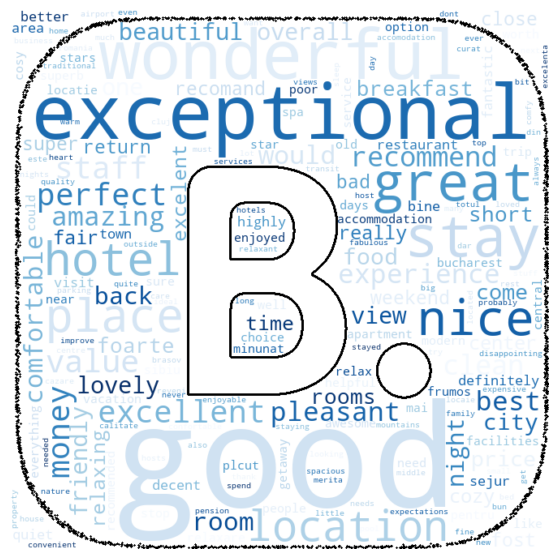

In [33]:
create_wordCloud(clean_reviews_title)

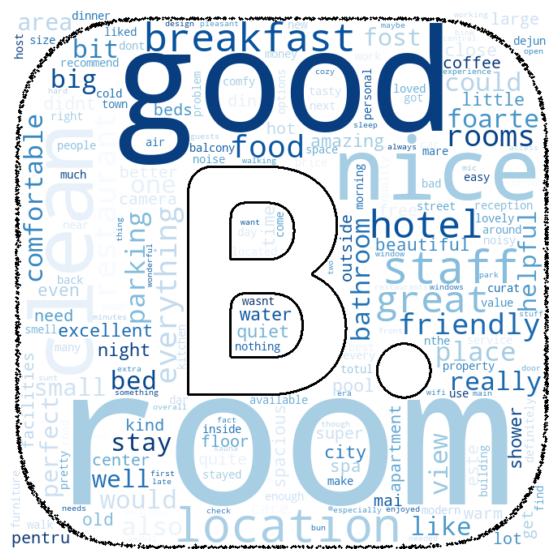

In [111]:
create_wordCloud(clean_positive_reviews)

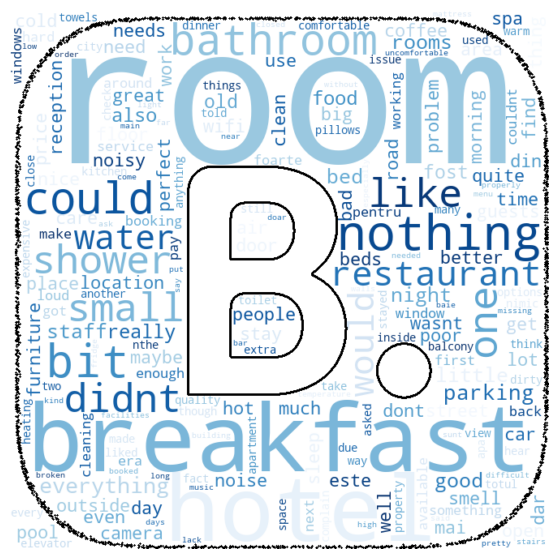

In [112]:
create_wordCloud(clean_negative_reviews)

In [ ]:
import nltk
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder

tokenized_reviews = hotels_df['clean_review'].apply(nltk.word_tokenize)

# Generate bi-grams from tokenized words
finder = BigramCollocationFinder.from_documents(tokenized_reviews)
bigrams = finder.ngram_fd.items()

# Sort bi-grams based on their frequency in descending order
sorted_bigrams = sorted(bigrams, key=lambda x: x[1], reverse=True)

# Select the top 10 most frequent bi-grams
top_10_bigrams = sorted_bigrams[:10]

# Extract bi-grams and their frequencies
bigrams = [' '.join(bigram) for bigram, _ in top_10_bigrams]
frequencies = [frequency for _, frequency in top_10_bigrams]
color='rgb(136,204,238)'
# Create a bar plot using Plotly
fig = go.Figure(data=go.Bar(x=bigrams, y=frequencies, marker=dict(color=color)))
fig.update_layout(title='Top 10 Most Frequent Bi-grams',
                  xaxis_title='Bi-grams',
                  yaxis_title='Frequency')

fig.show()


In [ ]:
import nltk
from nltk.collocations import TrigramAssocMeasures, TrigramCollocationFinder


tokenized_reviews = hotels_df['clean_review'].apply(nltk.word_tokenize)

# Generate tri-grams from tokenized words
finder = TrigramCollocationFinder.from_documents(tokenized_reviews)
trigrams = finder.ngram_fd.items()

# Sort tri-grams based on their frequency in descending order
sorted_trigrams = sorted(trigrams, key=lambda x: x[1], reverse=True)

# Select the top 10 most frequent tri-grams
top_10_trigrams = sorted_trigrams[:10]

# Extract tri-grams and their frequencies
trigrams = [' '.join(trigram) for trigram, _ in top_10_trigrams]
frequencies = [frequency for _, frequency in top_10_trigrams]
color='rgb(136,204,238)'

# Create a bar plot using Plotly
fig = go.Figure(data=go.Bar(x=trigrams, y=frequencies,marker=dict(color=color)))
fig.update_layout(title='Top 10 Most Frequent Tri-grams',
                  xaxis_title='Tri-grams',
                  yaxis_title='Frequency')

fig.show()


Resample dataset

In [34]:
negative_reviews_resampled = negative_reviews.sample(n=len(positive_reviews), replace=True, random_state=42)

balanced_reviews = pd.concat([positive_reviews, negative_reviews_resampled])

In [35]:
balanced_reviews

,review,review_type
1,Central location everything was within walking...,positive
2,-Acces to the room at little bit difficult,positive
3,"Excellent, as usual. Great location, right in ...",positive
5,"very nice rooms, very good breakfastnot 24/24 ...",positive
7,"Nice boutique hotel on the old city center,ver...",positive
...,...,...
17715,"Breakfast was great.Nothing to do, no family r...",negative
10228,The evening meal was really very good and the ...,negative
7332,Good WiFiVery bad condition. Not very clean. T...,negative
1354,"The hotel in itself is not bad, rooms are quit...",negative


In [36]:
balanced_reviews['review'][17]

'Breakfast was great. Location is good, so you can visit old city by walk. Hospitality was perfect, very nice staff at reception desk.parking is an issue, but not special to this hotel. it is all about the district.'

In [37]:
plot_count_percentage(feature, title, balanced_reviews,2)

Encoding Labels

In [38]:
label_enc = preprocessing.LabelEncoder()
encoded_review = label_enc.fit_transform(balanced_reviews.review_type.values)

In [39]:
encoded_review


array([1, 1, 1, ..., 0, 0, 0])

In [40]:
RANDOM_SEED = 42

train_reviews, test_reviews, y_train, y_test = train_test_split(
    balanced_reviews.review, 
    encoded_review, 
    test_size=0.25, 
    random_state=RANDOM_SEED
  )

TF-IDF Feature Engeneering

In [41]:
tfv = TfidfVectorizer(min_df=3,  max_features=None, 
            strip_accents='unicode', analyzer='word',
            ngram_range=(1, 3), use_idf=1,smooth_idf=1,sublinear_tf=1,
            stop_words = 'english')
tfv.fit(list(train_reviews) + list(test_reviews))

X_train_tfv =  tfv.transform(train_reviews) 
X_test_tfv = tfv.transform(test_reviews)

Word Embeddings 
*Vectors Universal Sentence Encoder from TF-HUB

In [42]:
module_url = 'https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3'
use = hub.load(module_url)

In [43]:
X_train = []
for r in tqdm(train_reviews):
  emb = use(r)
  review_emb = tf.reshape(emb, [-1]).numpy()
  X_train.append(review_emb)

X_train = np.array(X_train)

100%|██████████| 16200/16200 [05:37<00:00, 48.07it/s]


In [44]:
X_test = []
for r in tqdm(test_reviews):
  emb = use(r)
  review_emb = tf.reshape(emb, [-1]).numpy()
  X_test.append(review_emb)

X_test = np.array(X_test)

100%|██████████| 5400/5400 [01:52<00:00, 48.20it/s]


Random Forest

In [45]:
from sklearn.ensemble import RandomForestClassifier

clfRF = RandomForestClassifier(n_estimators=200, max_depth=7, random_state=42)
clfRF.fit(X_train_tfv, y_train)

rf_predictions = clfRF.predict_proba(X_test_tfv)
print(f"logloss: {metrics.log_loss(y_test, rf_predictions):0.3f}")
print(f"ROC AUC: {metrics.roc_auc_score(y_test, rf_predictions[:, 1]):0.3f}")


logloss: 0.652
ROC AUC: 0.931


In [46]:
frt_predictions = clfRF.predict(X_train_tfv)
title = "Classification Report Random Forest training"
print(title,"\n")
print(classification_report(y_train, frt_predictions.round()))
rf_predictions = clfRF.predict_proba(X_train_tfv)
print(f"logloss: {metrics.log_loss(y_train, rf_predictions):0.3f}")
print(f"ROC AUC: {metrics.roc_auc_score(y_train, rf_predictions[:, 1]):0.3f}")

Classification Report Random Forest training 

              precision    recall  f1-score   support

           0       0.80      0.93      0.86      8095
           1       0.91      0.77      0.84      8105

    accuracy                           0.85     16200
   macro avg       0.86      0.85      0.85     16200
weighted avg       0.86      0.85      0.85     16200

logloss: 0.650
ROC AUC: 0.941


In [47]:
fr_predictions = clfRF.predict(X_test_tfv)
title = "Classification Report Random Forest"
print(title,"\n")
print(classification_report(y_test, fr_predictions.round()))

Classification Report Random Forest 

              precision    recall  f1-score   support

           0       0.79      0.93      0.86      2705
           1       0.91      0.76      0.83      2695

    accuracy                           0.84      5400
   macro avg       0.85      0.84      0.84      5400
weighted avg       0.85      0.84      0.84      5400



Logistic Regression

In [48]:
clf = LogisticRegression(C=1.0, solver='lbfgs', max_iter=1000)
clf.fit(X_train_tfv, y_train)
lr_predictions = clf.predict_proba(X_test_tfv)

print (f"logloss Logistic Regression: {metrics.log_loss(y_test, lr_predictions):0.3f}")
print (f"ROC AUC Logistic Regression: {metrics.roc_auc_score(y_test, lr_predictions[:, 1]):0.3f}")

logloss Logistic Regression: 0.257
ROC AUC Logistic Regression: 0.996


In [49]:
lrt_predictions = clf.predict(X_train_tfv)
title = "Classification Report Logistic Regression training "
print(title,"\n")
print(classification_report(y_train, lrt_predictions.round()))
lr_predictions = clf.predict_proba(X_train_tfv)
print (f"logloss Logistic Regression: {metrics.log_loss(y_train, lr_predictions):0.3f}")
print (f"ROC AUC Logistic Regression: {metrics.roc_auc_score(y_train, lr_predictions[:, 1]):0.3f}")

Classification Report Logistic Regression training  

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      8095
           1       1.00      0.97      0.98      8105

    accuracy                           0.98     16200
   macro avg       0.98      0.98      0.98     16200
weighted avg       0.98      0.98      0.98     16200

logloss Logistic Regression: 0.228
ROC AUC Logistic Regression: 0.999


In [50]:
lr_predictions = clf.predict(X_test_tfv)
title = "Classification Report Logistic Regression testing"
print(title,"\n")
print(classification_report(y_test, lr_predictions.round()))

Classification Report Logistic Regression testing 

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      2705
           1       1.00      0.94      0.97      2695

    accuracy                           0.97      5400
   macro avg       0.97      0.97      0.97      5400
weighted avg       0.97      0.97      0.97      5400



Naive Bayes

In [51]:
clfNB = MultinomialNB()
clfNB.fit(X_train_tfv, y_train)
nb_predictions = clfNB.predict_proba(X_test_tfv)

print (f"logloss: {metrics.log_loss(y_test, nb_predictions):0.3f}")
print (f"ROC AUC: {metrics.roc_auc_score(y_test, nb_predictions[:, 1]):0.3f}")

logloss: 0.157
ROC AUC: 0.993


In [52]:
nbt_predictions = clfNB.predict(X_train_tfv)
title = "Classification Report Naive Bayes"
print(title,"\n")
print(classification_report(y_train, nbt_predictions.round()))

nb_predictions = clfNB.predict_proba(X_train_tfv)
print (f"logloss: {metrics.log_loss(y_train, nb_predictions):0.3f}")
print (f"ROC AUC: {metrics.roc_auc_score(y_train, nb_predictions[:, 1]):0.3f}")

Classification Report Naive Bayes 

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      8095
           1       0.97      0.99      0.98      8105

    accuracy                           0.98     16200
   macro avg       0.98      0.98      0.98     16200
weighted avg       0.98      0.98      0.98     16200

logloss: 0.113
ROC AUC: 0.998


In [53]:
nb_predictions = clfNB.predict(X_test_tfv)
title = "Classification Report Naive Bayes"
print(title,"\n")
print(classification_report(y_test, nb_predictions.round()))

Classification Report Naive Bayes 

              precision    recall  f1-score   support

           0       0.99      0.94      0.96      2705
           1       0.94      0.99      0.97      2695

    accuracy                           0.96      5400
   macro avg       0.97      0.97      0.96      5400
weighted avg       0.97      0.96      0.96      5400



[[2549  156]
 [  33 2662]]


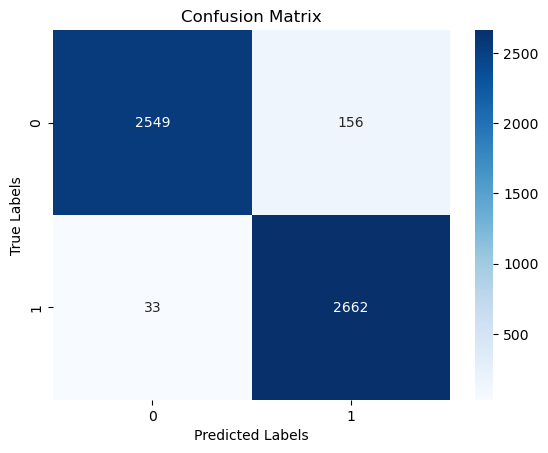

In [54]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, nb_predictions)
print(conf_matrix)
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

XGBoost

In [55]:
clfXGB = xgb.XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.8, 
                        subsample=0.8, nthread=10, learning_rate=0.1)
clfXGB.fit(X_train_tfv, y_train)
xgb_predictions = clfXGB.predict_proba(X_test_tfv)

print (f"logloss: {metrics.log_loss(y_test, xgb_predictions):0.3f}")
print (f"ROC AUC: {metrics.roc_auc_score(y_test, xgb_predictions[:, 1]):0.3f}")

logloss: 0.228
ROC AUC: 0.986


In [56]:
xgbt_predictions = clfXGB.predict(X_train_tfv)
title = "Classification Report XGBoost training"
print(title,"\n")
print(classification_report(y_train, xgbt_predictions.round()))

xgb_predictions = clfXGB.predict_proba(X_train_tfv)

print (f"logloss: {metrics.log_loss(y_train, xgb_predictions):0.3f}")
print (f"ROC AUC: {metrics.roc_auc_score(y_train, xgb_predictions[:, 1]):0.3f}")

Classification Report XGBoost training 

              precision    recall  f1-score   support

           0       0.92      0.98      0.95      8095
           1       0.98      0.92      0.95      8105

    accuracy                           0.95     16200
   macro avg       0.95      0.95      0.95     16200
weighted avg       0.95      0.95      0.95     16200

logloss: 0.198
ROC AUC: 0.993


In [57]:
xgb_predictions = clfXGB.predict(X_test_tfv)
title = "Classification Report XGBoost"
print(title,"\n")
print(classification_report(y_test, xgb_predictions.round()))

Classification Report XGBoost 

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      2705
           1       0.97      0.89      0.93      2695

    accuracy                           0.93      5400
   macro avg       0.93      0.93      0.93      5400
weighted avg       0.93      0.93      0.93      5400



In [58]:
from sklearn.metrics import accuracy_score

nb_accuracy = accuracy_score(y_test, nb_predictions.round())
xgb_accuracy = accuracy_score(y_test, xgb_predictions.round())
lr_accuracy = accuracy_score(y_test, lr_predictions.round())
rf_accuracy = accuracy_score(y_test, fr_predictions.round())

In [59]:
models = ['Naive Bayes', 'XGBoost', 'Logistic Regression','Random Forest']
accuracies = [nb_accuracy, xgb_accuracy, lr_accuracy, rf_accuracy]

In [ ]:
colors = px.colors.qualitative.Plotly

fig = go.Figure(data=[go.Bar(x=models, y=accuracies, marker=dict(color=colors), text=accuracies, textposition='auto')])
fig.update_layout(
    title='Accuracy Scores Machine Learning Models',
    xaxis_title='Model',
    yaxis_title='Accuracy Score'
)
fig.update_traces(texttemplate='%{text:.3f}', textfont=dict(color='black', size=12))
fig.show()

In [ ]:
from xgboost import XGBClassifier
from sklearn import metrics
import plotly.express as px

categories = ['staff', 'cleanliness', 'comfort', 'value money', 'location', 'wifi']

models = [
    LogisticRegression(C=1.0, solver='lbfgs', max_iter=1000),
    XGBClassifier(),
    MultinomialNB(),
    RandomForestClassifier()
]

df_sentiment = pd.DataFrame(columns=['Topic', 'Model', 'Sentiment'])

for topic in categories:
    for model in models:
        model.fit(X_train_tfv, y_train)
        predictions = model.predict(X_test_tfv)
        sentiment_score = metrics.roc_auc_score(y_test, predictions)
        df_sentiment = df_sentiment.append({'Topic': topic, 'Model': type(model).__name__, 'Sentiment': sentiment_score}, ignore_index=True)

fig = px.bar(df_sentiment,
             x='Topic',
             y='Sentiment',
             color='Model',
             barmode='group',
             title='Topic Sentiment Analysis',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()


Deep Learning Models

In [60]:
 def plot_history1(model):
    accuracy = model.history['accuracy']
    val_acc = model.history['val_accuracy']
    loss = model.history['loss']
    val_loss = model.history['val_loss']

    epochs = list(range(1, len(accuracy) + 1))

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=epochs, y=accuracy, mode='lines', name='Training accuracy'))
    fig.add_trace(go.Scatter(x=epochs, y=val_acc, mode='lines', name='Validation accuracy'))

    fig.update_layout(
        title='Training and Validation Accuracy',
        xaxis_title='Epochs',
        yaxis_title='Accuracy',
        legend=dict(x=0.7, y=0.9),
        width=800,
        height=400
    )

    fig.show()

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=epochs, y=loss, mode='lines', name='Training loss'))
    fig.add_trace(go.Scatter(x=epochs, y=val_loss, mode='lines', name='Validation loss'))

    fig.update_layout(
        title='Training and Validation Loss',
        xaxis_title='Epochs',
        yaxis_title='Loss',
        legend=dict(x=0.7, y=0.9),
        width=800,
        height=400
    )

    fig.show()


In [61]:
# plot model architecture
def plot_model(model):
  model.summary()
  return tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96,
    layer_range=None,
)


LSTM Model
We need to Reshape Dataset to have the LSTM layer (NumberOfExamples, TimeSteps, FeaturesPerStep)

In [62]:
X_train_reshaped = X_train[:, np.newaxis,:]
X_test_reshaped = X_test[:, np.newaxis,:]
y_train_reshaped = y_train[:, np.newaxis, np.newaxis]
y_test_reshaped = y_test[:, np.newaxis, np.newaxis]

In [63]:
X_train_reshaped.shape

(16200, 1, 512)

In [64]:
y_train_reshaped.shape

(16200, 1, 1)

In [65]:
def build_model_lstm():
    model = Sequential()
    model.add(LSTM(256, activation='sigmoid', return_sequences=True,
                 input_shape=(1,X_train_reshaped.shape[2])
                 ))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.0005))
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 256)            787456    
                                                                 
 dense (Dense)               (None, 1, 128)            32896     
                                                                 
 dense_1 (Dense)             (None, 1, 1)              129       
                                                                 
Total params: 820,481
Trainable params: 820,481
Non-trainable params: 0
_________________________________________________________________


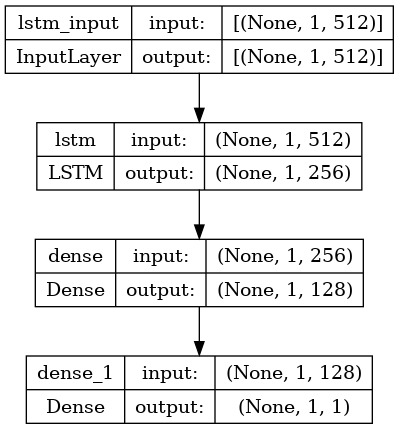

In [66]:
model_lstm_1 = build_model_lstm()
plot_model(model_lstm_1)

In [67]:
history_lstm_1 = model_lstm_1.fit(
    X_train_reshaped, y_train_reshaped, 
    epochs=10, 
    batch_size=16, 
    validation_split=0.1, 
    verbose=1, 
    shuffle=True
)

Epoch 1/10
912/912 [==============================] - 13s 8ms/step - loss: 0.5878 - accuracy: 0.6717 - val_loss: 0.5392 - val_accuracy: 0.7407
Epoch 2/10
912/912 [==============================] - 7s 8ms/step - loss: 0.5004 - accuracy: 0.7532 - val_loss: 0.5052 - val_accuracy: 0.7481
Epoch 3/10
912/912 [==============================] - 8s 9ms/step - loss: 0.4796 - accuracy: 0.7680 - val_loss: 0.4995 - val_accuracy: 0.7679
Epoch 4/10
912/912 [==============================] - 7s 8ms/step - loss: 0.4716 - accuracy: 0.7738 - val_loss: 0.4945 - val_accuracy: 0.7685
Epoch 5/10
912/912 [==============================] - 7s 8ms/step - loss: 0.4623 - accuracy: 0.7807 - val_loss: 0.4889 - val_accuracy: 0.7685
Epoch 6/10
912/912 [==============================] - 7s 8ms/step - loss: 0.4558 - accuracy: 0.7857 - val_loss: 0.4773 - val_accuracy: 0.7735
Epoch 7/10
912/912 [==============================] - 8s 8ms/step - loss: 0.4482 - accuracy: 0.7896 - val_loss: 0.4792 - val_accuracy: 0.7747
Epoch

In [68]:
model_lstm_1.evaluate(X_test_reshaped, y_test_reshaped)

169/169 [==============================] - 1s 3ms/step - loss: 0.4490 - accuracy: 0.7913


[0.44898727536201477, 0.7912963032722473]

In [69]:
plot_history1(history_lstm_1)

In [70]:
def build_model_lstm_2():
  model = Sequential()

  model.add(LSTM(256, activation='relu', return_sequences=True,
                 input_shape=(1,X_train_reshaped.shape[2])
                 ))
  model.add(LSTM(128, dropout=0.2, activation='relu', return_sequences=True))

  model.add(LSTM(64, dropout=0.2, activation='relu',  return_sequences=True))

  model.add(Dense(1, activation='sigmoid'))

  model.compile(loss='binary_crossentropy',
            metrics=['accuracy'],
            optimizer=Adam(learning_rate=0.0005))
  return model

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 1, 256)            787456    
                                                                 
 lstm_2 (LSTM)               (None, 1, 128)            197120    
                                                                 
 lstm_3 (LSTM)               (None, 1, 64)             49408     
                                                                 
 dense_2 (Dense)             (None, 1, 1)              65        
                                                                 
Total params: 1,034,049
Trainable params: 1,034,049
Non-trainable params: 0
_________________________________________________________________


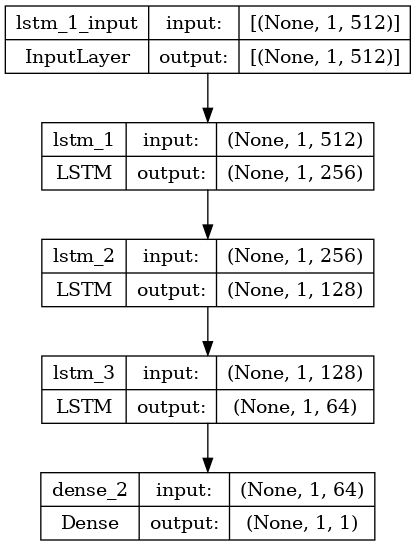

In [71]:
model_lstm_2 = build_model_lstm_2()
plot_model(model_lstm_2)

In [72]:
history = model_lstm_2.fit(
    X_train_reshaped, y_train_reshaped, 
    epochs=10, 
    batch_size=16, 
    validation_split=0.1, 
    verbose=1, 
    shuffle=True
)

Epoch 1/10
912/912 [==============================] - 21s 18ms/step - loss: 0.5349 - accuracy: 0.7198 - val_loss: 0.4939 - val_accuracy: 0.7605
Epoch 2/10
912/912 [==============================] - 15s 17ms/step - loss: 0.4214 - accuracy: 0.7995 - val_loss: 0.4139 - val_accuracy: 0.8191
Epoch 3/10
912/912 [==============================] - 16s 18ms/step - loss: 0.3204 - accuracy: 0.8625 - val_loss: 0.2922 - val_accuracy: 0.8833
Epoch 4/10
912/912 [==============================] - 15s 17ms/step - loss: 0.2266 - accuracy: 0.9093 - val_loss: 0.2434 - val_accuracy: 0.9198
Epoch 5/10
912/912 [==============================] - 16s 17ms/step - loss: 0.1589 - accuracy: 0.9406 - val_loss: 0.1877 - val_accuracy: 0.9383
Epoch 6/10
912/912 [==============================] - 15s 17ms/step - loss: 0.1134 - accuracy: 0.9566 - val_loss: 0.1790 - val_accuracy: 0.9426
Epoch 7/10
912/912 [==============================] - 16s 17ms/step - loss: 0.0804 - accuracy: 0.9701 - val_loss: 0.1687 - val_accuracy:

In [73]:
model_lstm_2.evaluate(X_test_reshaped, y_test_reshaped)

169/169 [==============================] - 1s 5ms/step - loss: 0.1325 - accuracy: 0.9672


[0.13250936567783356, 0.9672222137451172]

In [74]:
plot_history1(history)


In [75]:
model_lstm_2.evaluate(X_test_reshaped, y_test_reshaped)


169/169 [==============================] - 1s 4ms/step - loss: 0.1325 - accuracy: 0.9672


[0.13250936567783356, 0.9672222137451172]

In [76]:
model_lstm_2.save("lstm_sentiment_model.h5")

In [77]:
imported_model = tf.keras.models.load_model('/kaggle/working/lstm_sentiment_model.h5')
imported_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 1, 256)            787456    
                                                                 
 lstm_2 (LSTM)               (None, 1, 128)            197120    
                                                                 
 lstm_3 (LSTM)               (None, 1, 64)             49408     
                                                                 
 dense_2 (Dense)             (None, 1, 1)              65        
                                                                 
Total params: 1,034,049
Trainable params: 1,034,049
Non-trainable params: 0
_________________________________________________________________


Prediction for positive and negative sentiment of the new reviews


In [78]:
text = 'The view of the room was perfect!'
emb_test = use(text)
emb_test.shape

TensorShape([1, 512])

In [79]:
emb_test_reshaped = emb_test[:, np.newaxis, :]
emb_test_reshaped.shape

TensorShape([1, 1, 512])

In [80]:
imported_model.predict(emb_test_reshaped)

1/1 [==============================] - 0s 462ms/step


array([[[0.99809855]]], dtype=float32)

In [81]:
(imported_model.predict(emb_test_reshaped)[0][0][0] > 0.5).astype('int32')


1/1 [==============================] - 0s 20ms/step


1

In [82]:
sentiment_val = (imported_model.predict(emb_test_reshaped) > 0.5).astype('int32')

"Positive" if sentiment_val == 1 else "Negative"

1/1 [==============================] - 0s 21ms/step


'Positive'

In [83]:
text = 'The breakfast and services was very bad, I will never return in this hotel!'
emb_test = use(text)

emb_test_reshaped = emb_test[:, np.newaxis, :]
emb_test_reshaped.shape

imported_model.predict(emb_test_reshaped)

1/1 [==============================] - 0s 20ms/step


array([[[0.00805912]]], dtype=float32)

In [84]:
sentimen_val = (imported_model.predict(emb_test_reshaped) > 0.5).astype('int32')
"Positive" if sentimen_val == 1 else "Negative"

1/1 [==============================] - 0s 20ms/step


'Negative'

Prediction pipeline

In [85]:
def predict_sentiment(txt):
    # Check if text is empty or contains only whitespace
    if not txt.strip():
        return "Invalid input: Empty text"

    emb_txt = use(txt)
    emb_test_reshaped = emb_txt[:, np.newaxis, :]
    sentiment_val = (imported_model.predict(emb_test_reshaped) > 0.5).astype('int32')
    print("Score:", imported_model.predict(emb_test_reshaped).flatten()[0])
    return "Positive" if sentiment_val == 1 else "Negative"

In [86]:
review_text = "I hate the room , very small space and very poor breakfast."
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 21ms/step
Score: 0.0011774097


'The sentiment of this review: Negative'

In [87]:
review_text = " "
f"{predict_sentiment(review_text)}"

'Invalid input: Empty text'

In [88]:
review_text = "Nu mi-a placut deloc, conditii horror!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 22ms/step
Score: 0.00026324057


'The sentiment of this review: Negative'

In [89]:
review_text = "The hotel has incredible sea view, I love it!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 19ms/step
Score: 1.0


'The sentiment of this review: Positive'

In [90]:
review_text = "Servicii de inalta calitate, voi mai reveni cu drag ori de cate ori voi avea ocazia!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 20ms/step
Score: 0.99999607


'The sentiment of this review: Positive'

In [91]:
review_text = "Ho trascorso un soggiorno da sogno, amore a prima vista!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 19ms/step
Score: 1.0


'The sentiment of this review: Positive'

In [92]:
review_text = "La musique a été entendue toute la nuit, je ne reviendrai plus jamais dans cet endroit!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 22ms/step
Score: 0.0026494863


'The sentiment of this review: Negative'

In [93]:
review_text = "Ich habe meine Flitterwochen hier verbracht, es war unglaublich!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 20ms/step
Score: 1.0


'The sentiment of this review: Positive'

In [94]:
review_text = "La comida y el ambiente eran geniales, ¡me encanta!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 24ms/step
Score: 1.0


'The sentiment of this review: Positive'

Rusa: '3 zile am stat in acest apartament, a fost frig si inghesuit!'

In [95]:
review_text ="Я пробыл в этой квартире 3 дня, было холодно и тесно!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 20ms/step
Score: 0.21346352


'The sentiment of this review: Negative'

In [96]:
review_text ="bardzo przyjazny personel, doskonałe śniadanie, piękny basen!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 21ms/step
Score: 0.9999976


'The sentiment of this review: Positive'

In [97]:
review_text ="لا أفهم لماذا يفضل الناس هذا الفندق ، إنه مكلف للغاية وليس لديه ما يقدمه!"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 21ms/step
Score: 0.0011198967


'The sentiment of this review: Negative'

In [98]:
review_text ="我可以說我睡得像木頭一樣，非凡的住宿"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 21ms/step
Score: 0.73936945


'The sentiment of this review: Positive'

In [99]:
review_text = "終わりよければ全てよし！ 私はお勧め！"
f"The sentiment of this review: {predict_sentiment(review_text)}"

1/1 [==============================] - 0s 20ms/step
Score: 1.0


'The sentiment of this review: Positive'